In [1]:
%%capture
import re
from pathlib import Path
from datetime import datetime

import rasterio.features
import geopandas as gpd
import fiona
import rioxarray as rxr
import xarray as xr

from shapely.geometry import mapping

import matplotlib.pyplot as plt


In [2]:
MASKS_PATH = 'data\mask_per_year.gpkg'
IMAGES_PATH = Path('data\images')

grid = gpd.read_file('data\grid.gpkg')
years = fiona.listlayers(MASKS_PATH) # list layers/years

# read the masks 
mask_per_year = {key: gpd.read_file(MASKS_PATH, layer=key) for key in years}

# CRS assertion 
for year in years:
    assert mask_per_year[year].crs == grid.crs, 'CRS must match'
assert grid.is_valid.all(), 'Invalid geometry'

# clip by grid extent 
mask_per_year = {key: values.clip(grid) for key, values in mask_per_year.items()}

In [3]:
paths = list(IMAGES_PATH.glob('*'))

paths = [str(p) for p in paths]


In [8]:
imgs_by_year = []

for imgs in paths[:2]:
    # get the year name in the file path 
    year = re.findall(r"[\w+']+", imgs)[-2].split('_')[-1]
    xr_imgs = rxr.open_rasterio(imgs).squeeze()

    # set time dim/attributes 
    xr_imgs['time'] = datetime.strptime(year, '%Y')
    xr_imgs.attrs['year'] = year

    # clip by grid extent 
    xr_imgs_clipped = xr_imgs.rio.clip(grid.geometry.apply(mapping), grid.crs)
    
    imgs_by_year.append(xr_imgs_clipped)

In [ ]:
# get 

In [7]:
# Check if the image paths match the list of layers 
# read 
# get dim time 
# xr.concat

time_var = xr.Variable('time', paths_to_datetimeindex(scene_directories)

SyntaxError: unexpected EOF while parsing (3978837033.py, line 6)

In [ ]:
img_1942 = rxr.open_rasterio(images[0]).squeeze()
img_1942.attrs['year'] = 1942
img_1942=img_1942.expand_dims('Time')
img_1942
# img_1942_clipped = img_1942.rio.clip(grid.geometry.apply(mapping), grid.crs)

# img_1942_clipped.plot.imshow()

<xarray.DataArray (Time: 1, y: 17504, x: 20480)>
array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint8)
Coordinates:
    band         int32 1
  * x            (x) float64 5.182e+05 5.182e+05 ... 5.336e+05 5.336e+05
  * y            (y) float64 6.251e+06 6.251e+06 ... 6.238e+06 6.238e+06
    spatial_ref  int32 0
Dimensions without coordinates: Time
Attributes:
    scale_factor:  1.0
    add_offset:    0.0
    year:          1942

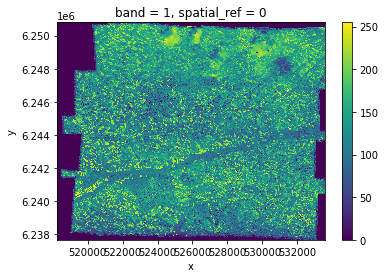

In [ ]:
img_1942.plot.imshow()


TypeError: Invalid shape (1, 1, 17564, 20480) for image data

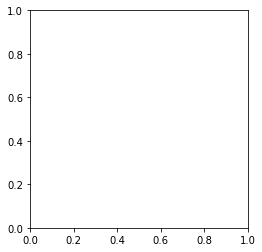

In [ ]:
# img_1962 = rxr.open_rasterio("data\images\Orthophotomosaic_Tile_0_0.tif")
# xds = xarray.open_dataset("data\)
# xds
# # img_1962.rio.set_spatial_dims(x_dim="x", y_dim="y", inplace=True)

# # img_1962 = img_1962.rio.write_crs(2154)

# # img_1962.rio.set_spatial_dims(x_dim="north_south", y_dim="east_west", inplace=True)

# plt.imshow(xds.to_array())
# # mask_per_year['1962'].plot()              

In [ ]:
img = rasterio.features.rasterize([mask_per_year['2020']['geometry']], out_shape=(60, 50))


C:\Users\vi_lu\anaconda3\envs\geopandas\lib\site-packages\rasterio\features.py:318: ShapeSkipWarning: Invalid or empty shape {'type': 'FeatureCollection', 'features': [{'id': '4379', 'type': 'Feature', 'properties': {}, 'geometry': {'type': 'Polygon', 'coordinates': (((531499.500000003, 6248485.299999996), (531492.5000000002, 6248484.299999998), (531502.4999999984, 6248482.200000001), (531504.4999999981, 6248480.200000002), (531507.5000000016, 6248479.199999999), (531508.4999999973, 6248478.200000001), (531508.3999999977, 6248476.200000002), (531507.4000000019, 6248475.199999996), (531503.4000000028, 6248475.2), (531502.3999999989, 6248474.200000002), (531501.400000003, 6248471.299999999), (531499.4000000034, 6248467.299999998), (531498.3999999994, 6248464.299999993), (531497.4000000037, 6248463.3), (531494.4000000004, 6248464.299999993), (531491.3999999969, 6248465.399999998), (531488.4000000014, 6248464.400000004), (531485.3999999982, 6248463.400000002), (531484.4000000024, 6248462.3

ValueError: No valid geometry objects found for rasterize

<AxesSubplot:>

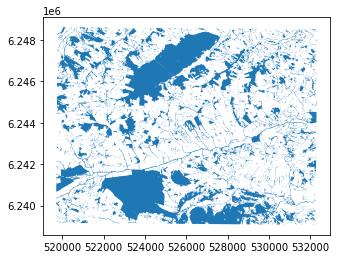

In [ ]:
mask_per_year['2020'].plot()

In [ ]:
# make_valid(mask_per_year['1942'])

In [ ]:
# if not img_1942.crs == grid.crs:
#     raise AssertionError('CRS of layers does not match')
# grid['geometry'] = grid.buffer(0)

# mask_per_year['1962']['geometry'] = mask_per_year['1962'].buffer(0)

# mask_per_year['1962'].clip(grid).plot()